<b>Dataset:</b> https://www.kaggle.com/datasets/fareselmenshawii/face-detection-dataset?resource=download-directory<br><br>
Train: 13386 images<br>
Val: 3347 images<br><br>


In [1]:
import sys
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [2]:
src_path = os.path.abspath("../src")
if src_path not in sys.path:
    sys.path.append(src_path)

# 1. Image Loading

In [3]:
from image_loader import load_image, load_images_from_dir, show_image

In [4]:
dataset_path = "../data/"
images = load_images_from_dir(dataset_path)

Loading images:  64%|██████▍   | 9/14 [00:00<00:00, 76.32it/s]

File ../data/video is not found.
File ../data/.DS_Store is not found.
File ../data/images is not found.


Loading images: 100%|██████████| 14/14 [00:00<00:00, 26.13it/s]


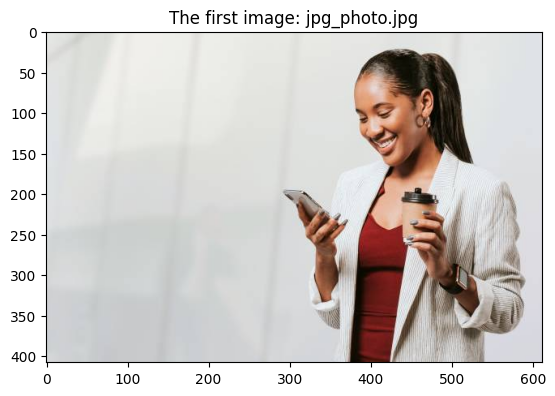

In [5]:
if images:
    filename, img = images[0]
    show_image(img, f"The first image: {filename}")
else:
    print(f"Error: There are no images in the folder.")

# 2. Analysis

In [5]:
from image_analysis import get_image_info, plot_histogram, enhance_contrast_hist_equalization, enhance_contrast_clahe, enhance_contrast_gamma

In [7]:
for elem in images:

    filename, img = elem
    info = get_image_info(img, dataset_path + filename)

    for el in info:
        print(f"{el}: {info[el]}")
    print("\n")

File: jpg_photo.jpg
Format: JPEG
Size (px): (612, 408)
Channels: 3
Color Mode: RGB
File Size (bytes): 21052
Extension: .jpg


File: holiday.jpeg
Format: JPEG
Size (px): (259, 194)
Channels: 3
Color Mode: RGB
File Size (bytes): 39690
Extension: .jpeg


File: png_image.png
Format: PNG
Size (px): (512, 512)
Channels: 3
Color Mode: L
File Size (bytes): 167034
Extension: .png


File: nature.jpeg
Format: JPEG
Size (px): (275, 183)
Channels: 3
Color Mode: RGB
File Size (bytes): 10109
Extension: .jpeg


File: bmp_photo.bmp
Format: BMP
Size (px): (2612, 3445)
Channels: 3
Color Mode: 1
File Size (bytes): 1130022
Extension: .bmp


File: house_for_otsu.jpg
Format: JPEG
Size (px): (1024, 768)
Channels: 3
Color Mode: L
File Size (bytes): 106568
Extension: .jpg


File: man.jpg
Format: JPEG
Size (px): (612, 408)
Channels: 3
Color Mode: RGB
File Size (bytes): 33906
Extension: .jpg


File: woman.jpeg
Format: JPEG
Size (px): (1471, 980)
Channels: 3
Color Mode: RGB
File Size (bytes): 73894
Extension: .jpe

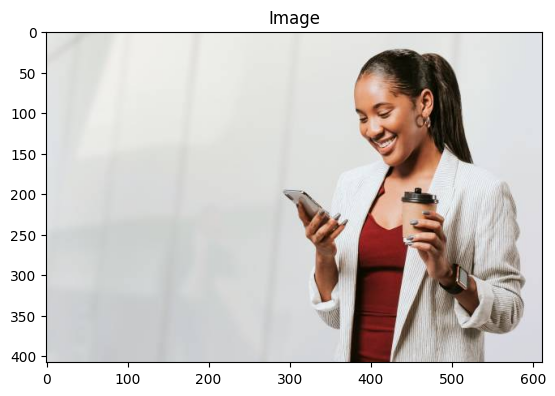

In [8]:
jpg_img = load_image("../data/jpg_photo.jpg")
show_image(jpg_img)

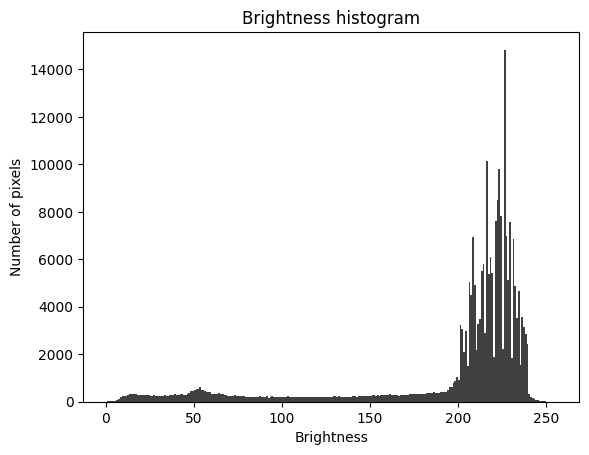

In [9]:
plot_histogram(jpg_img)

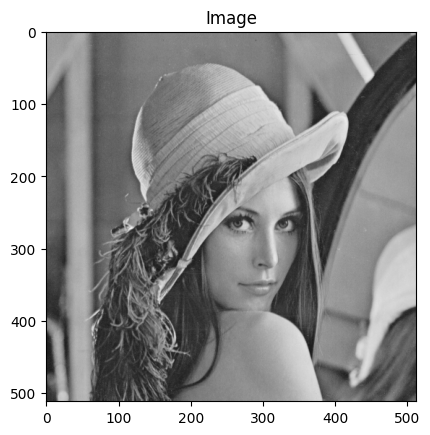

In [10]:
png_img = load_image("../data/png_image.png")
show_image(png_img)

In [11]:
hist_eq_img = enhance_contrast_hist_equalization(png_img)
clahe_img = enhance_contrast_clahe(png_img)
gamma_img = enhance_contrast_gamma(png_img, gamma=1.2)

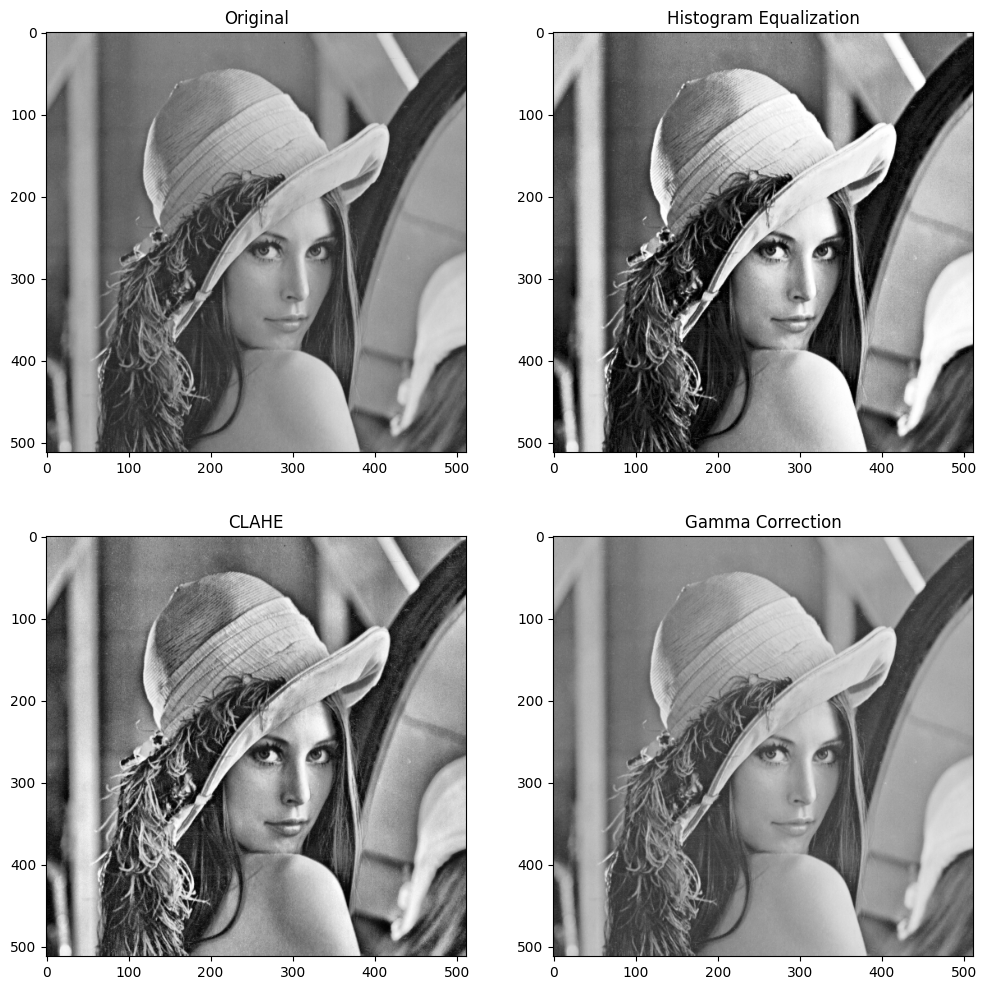

In [12]:
plt.figure(figsize=(12, 12))

plt.subplot(2, 2, 1)
plt.imshow(png_img)
plt.title("Original")

plt.subplot(2, 2, 2)
plt.imshow(hist_eq_img, cmap='gray')
plt.title("Histogram Equalization")

plt.subplot(2, 2, 3)
plt.imshow(clahe_img, cmap='gray')
plt.title("CLAHE")

plt.subplot(2, 2, 4)
plt.imshow(gamma_img, cmap='gray')
plt.title("Gamma Correction")

plt.show()


# 3. Applying Filters and Sharpening

## Filters

In [6]:
from image_filters import gaussian_filter, median_filter, bilateral_filter

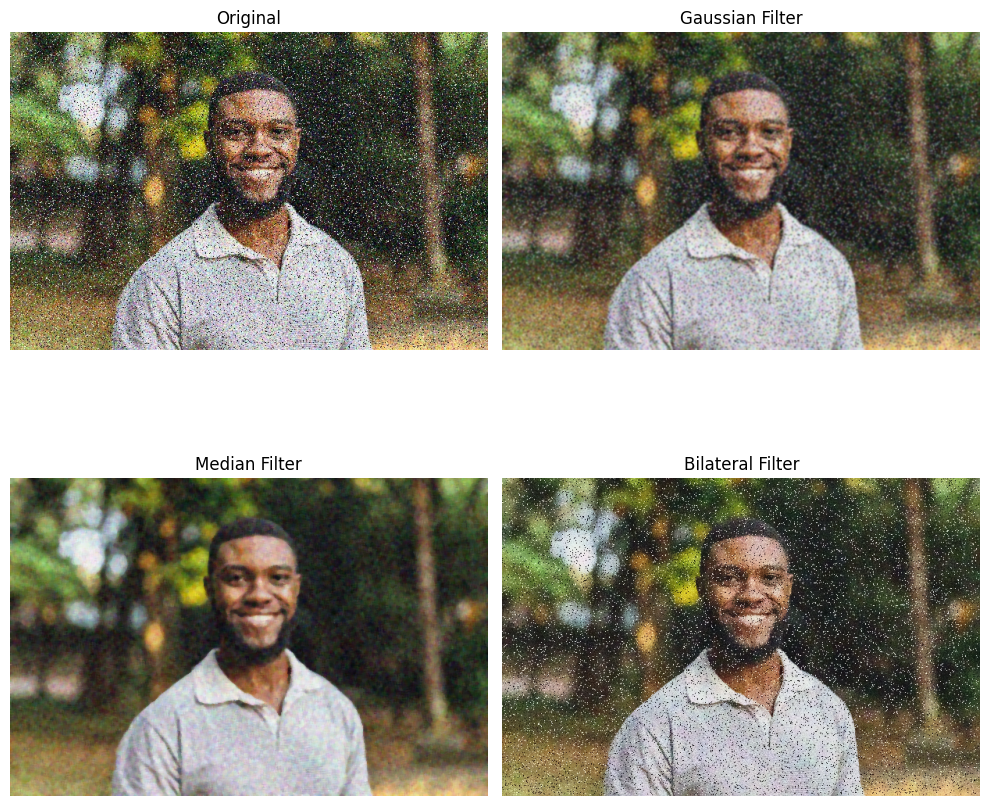

In [14]:
brain_img = load_image("../data/man_noisy.jpg")

gaussian_brain_img= gaussian_filter(brain_img, kernel_size=7)
median_brain_img = median_filter(brain_img, kernel_size=5)
bilateral_brain_img = bilateral_filter(brain_img, diameter=15, sigma_color=75, sigma_space=75)

plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.imshow(brain_img)
plt.title("Original")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.imshow(gaussian_brain_img)
plt.title("Gaussian Filter")
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(median_brain_img)
plt.title("Median Filter")
plt.axis("off")

plt.subplot(2, 2, 4)
plt.imshow(bilateral_brain_img)
plt.title("Bilateral Filter")
plt.axis("off")

plt.tight_layout()
plt.show()

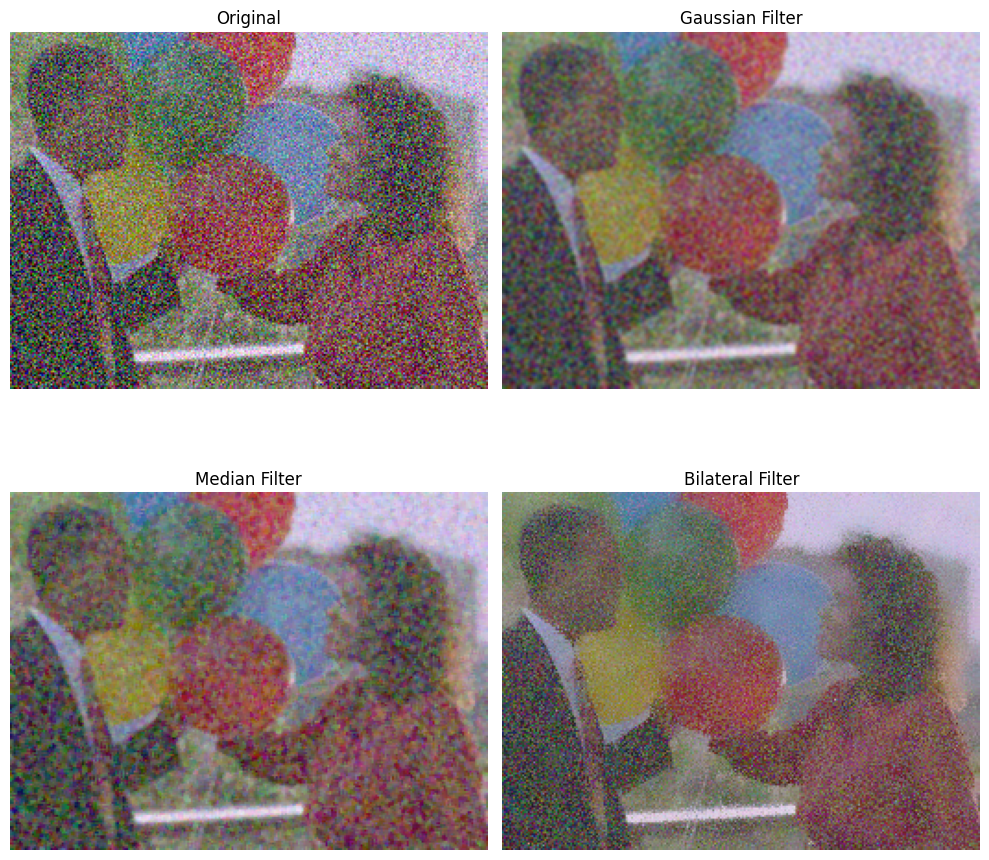

In [15]:
happy_img = load_image("../data/holiday.jpeg")

gaussian_happy_img = gaussian_filter(happy_img , kernel_size=3)
median_happy_img  = median_filter(happy_img , kernel_size=3)
bilateral_happy_img  = bilateral_filter(happy_img , diameter=15, sigma_color=75, sigma_space=75)

plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.imshow(happy_img)
plt.title("Original")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.imshow(gaussian_happy_img)
plt.title("Gaussian Filter")
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(median_happy_img)
plt.title("Median Filter")
plt.axis("off")

plt.subplot(2, 2, 4)
plt.imshow(bilateral_happy_img)
plt.title("Bilateral Filter")
plt.axis("off")

plt.tight_layout()
plt.show()

## Sharpening

In [7]:
from image_sharpening import laplacian_sharpening, unsharp_masking

In [17]:
one_img = load_image("../data/png_image.png")

In [18]:
laplacian_sharpened = laplacian_sharpening(one_img)
unsharp_masked = unsharp_masking(one_img, sigma=2.5, strength=1.5)

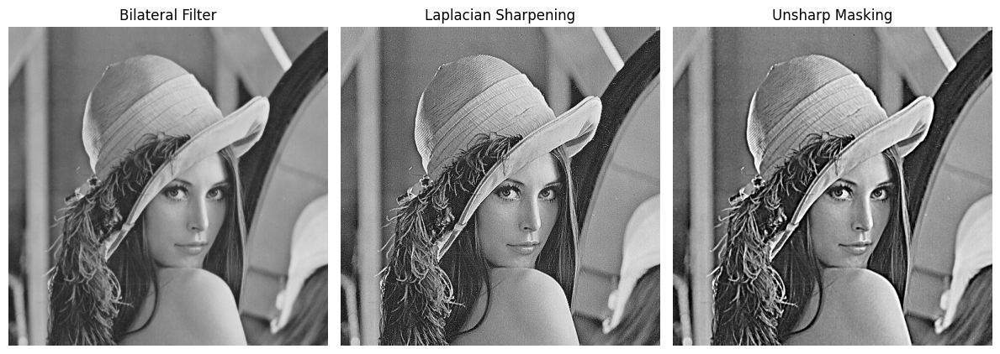

In [19]:
plt.figure(figsize=(12,8))

plt.subplot(1, 3, 1)
plt.imshow(one_img)
plt.title("Bilateral Filter")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(laplacian_sharpened)
plt.title("Laplacian Sharpening")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(unsharp_masked)
plt.title("Unsharp Masking")
plt.axis("off")

plt.tight_layout()
plt.show()

# 4. Segmentation

In [8]:
from image_segmentation import threshold, otsu_threshold, watershed_segmentation, grabcut, get_object_bounding_box

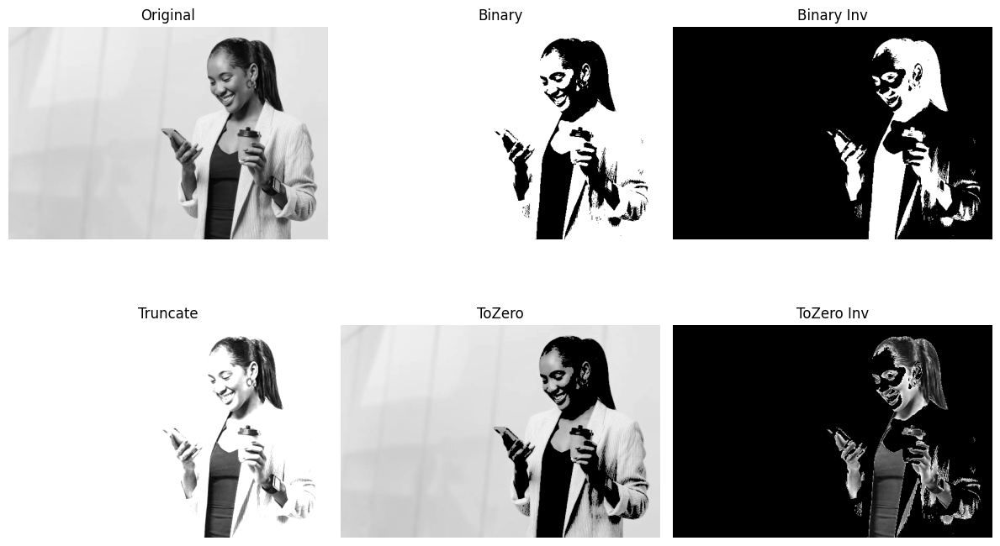

In [21]:
img = load_image("../data/jpg_photo.jpg")
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

threshold_types = [
    (cv2.THRESH_BINARY, "Binary"),
    (cv2.THRESH_BINARY_INV, "Binary Inv"),
    (cv2.THRESH_TRUNC, "Truncate"),
    (cv2.THRESH_TOZERO, "ToZero"),
    (cv2.THRESH_TOZERO_INV, "ToZero Inv")
]

fig, axes = plt.subplots(2, 3, figsize=(12, 8))

axes[0, 0].imshow(img_gray, cmap='gray')
axes[0, 0].set_title("Original")
axes[0, 0].axis("off")

for ax, (thr_type, title) in zip(axes.ravel()[1:], threshold_types):
    thresh_img = threshold(img_gray, thr_type)
    ax.imshow(thresh_img, cmap='gray')
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()

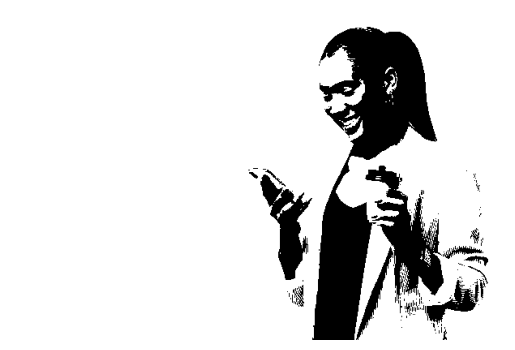

In [22]:
thresh_img = otsu_threshold(img_gray)
plt.imshow(thresh_img, cmap='gray')
plt.axis('off')
plt.show()

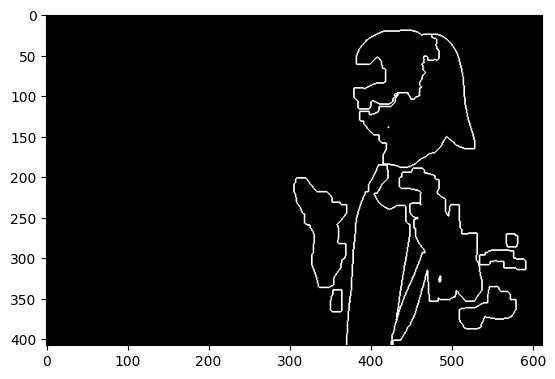

In [23]:
img = load_image("../data/jpg_photo.jpg")
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
segmented = watershed_segmentation(img_gray)

plt.imshow(segmented, cmap="gray")  
plt.show()

/Users/olena/.pyenv/versions/3.9.6/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/olena/.pyenv/versions/3.9.6/lib/python3.9/site-packages/numpy/core/_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


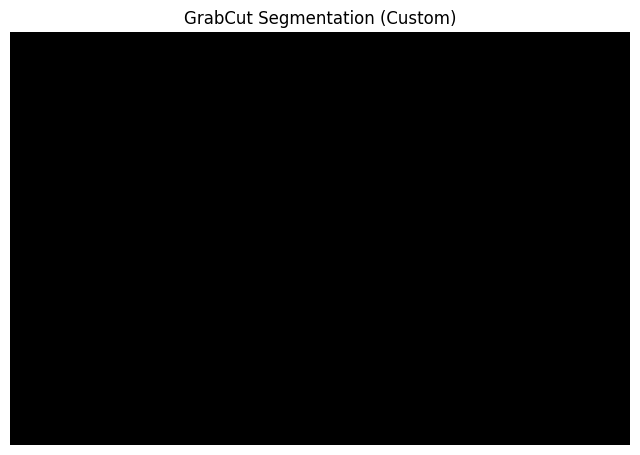

In [24]:
img = cv2.imread("../data/people.jpg")
rect = get_object_bounding_box(img)

segmented = grabcut(img, rect)

plt.figure(figsize=(8, 6))
plt.imshow(segmented, cmap="gray")
plt.title("GrabCut Segmentation (Custom)")
plt.axis("off")
plt.show()


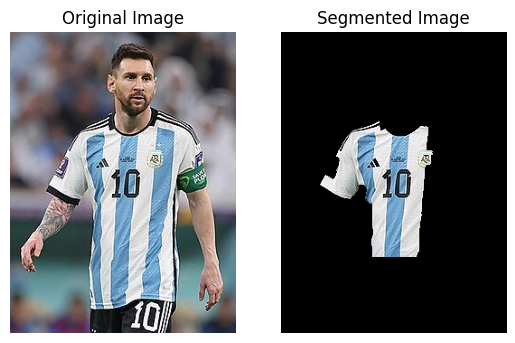

In [34]:
# path to input image specified and 
# image is loaded with imread command
image = cv2.imread("../data/messi.jpg")

# create a simple mask image similar
# to the loaded image, with the 
# shape and return type
mask = np.zeros(image.shape[:2], np.uint8)

# specify the background and foreground model
# using numpy the array is constructed of 1 row
# and 65 columns, and all array elements are 0
# Data type for the array is np.float64 (default)
backgroundModel = np.zeros((1, 65), np.float64)
foregroundModel = np.zeros((1, 65), np.float64)

# define the Region of Interest (ROI)
# as the coordinates of the rectangle
# where the values are entered as
# (startingPoint_x, startingPoint_y, width, height)
# these coordinates are according to the input image
# it may vary for different images
rectangle = (20, 100, 150, 150)

# apply the grabcut algorithm with appropriate
# values as parameters, number of iterations = 3 
# cv2.GC_INIT_WITH_RECT is used because
# of the rectangle mode is used 
cv2.grabCut(image, mask, rectangle, 
			backgroundModel, foregroundModel,
			3, cv2.GC_INIT_WITH_RECT)

# In the new mask image, pixels will 
# be marked with four flags 
# four flags denote the background / foreground 
# mask is changed, all the 0 and 2 pixels 
# are converted to the background
# mask is changed, all the 1 and 3 pixels
# are now the part of the foreground
# the return type is also mentioned,
# this gives us the final mask
mask2 = np.where((mask == 2)|(mask == 0), 0, 1).astype('uint8')

# The final mask is multiplied with 
# the input image to give the segmented image.
image_segmented = image * mask2[:, :, np.newaxis]

# output segmented image with colorbar
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

# Display the segmented image
plt.subplot(1, 2, 2)
plt.title('Segmented Image')
plt.imshow(cv2.cvtColor(image_segmented, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.show()


# 5. Highlighting features and descriptors

In [9]:
from face_contour_detection import detect_face_contours, show_detected_faces
from feature_extraction import extract_features, visualize_features

In [16]:
img = images[8][1]

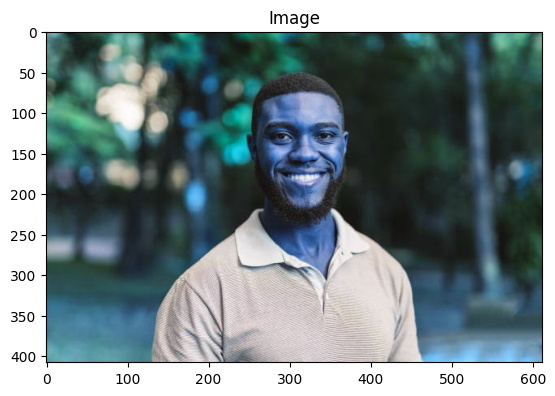

In [17]:
show_image(img)

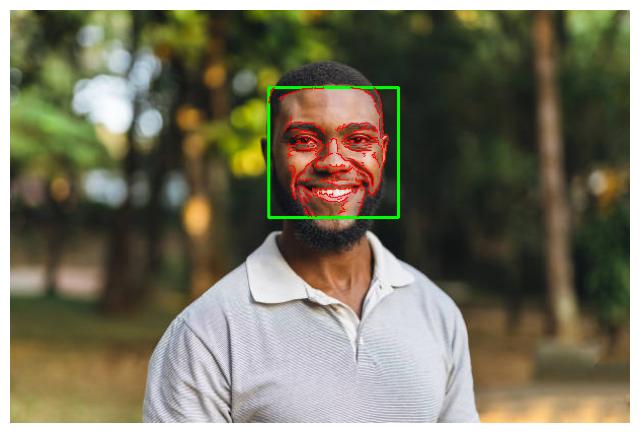

In [18]:
faces, contours_list = detect_face_contours(img)

show_detected_faces(img, contours_list)

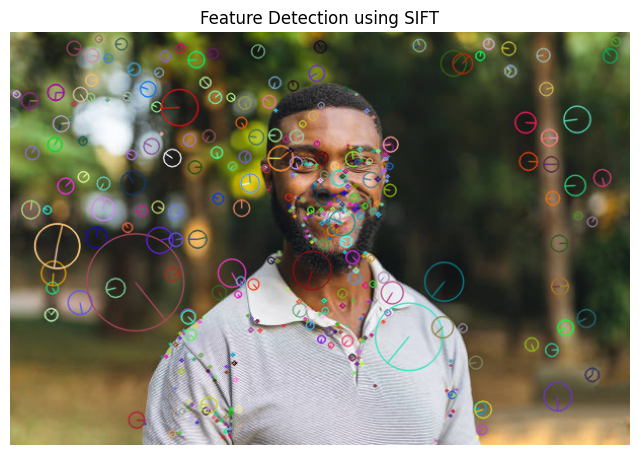

457
(457, 128)


In [19]:
method = "SIFT"
keypoints, descriptors = extract_features(img, method)
visualize_features(img, keypoints, method)

print(len(keypoints))
print(descriptors.shape if descriptors is not None else None)

SURF is not available in your OpenCV build. Using SIFT instead.


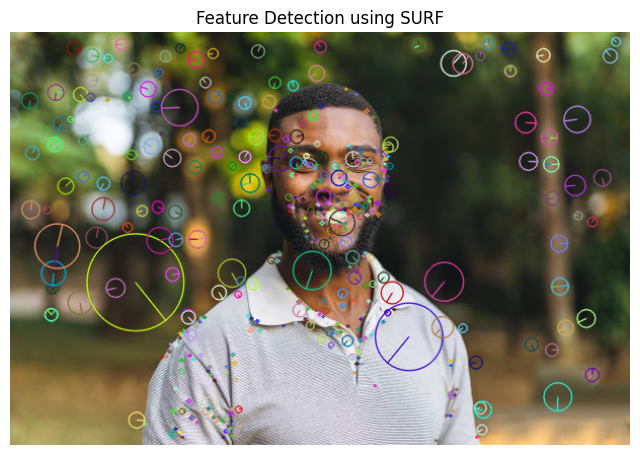

457
(457, 128)


In [20]:
method = "SURF"
keypoints, descriptors = extract_features(img, method)
visualize_features(img, keypoints, method)

print(len(keypoints))
print(descriptors.shape if descriptors is not None else None)

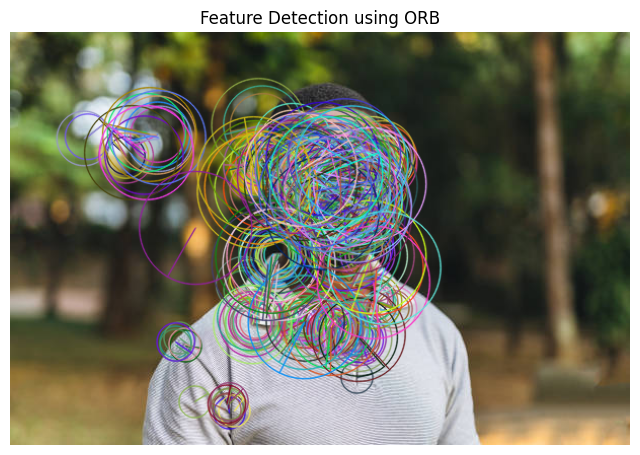

500
(500, 32)


In [21]:
method = "ORB"
keypoints, descriptors = extract_features(img, method)
visualize_features(img, keypoints, method)

print(len(keypoints))
print(descriptors.shape if descriptors is not None else None)

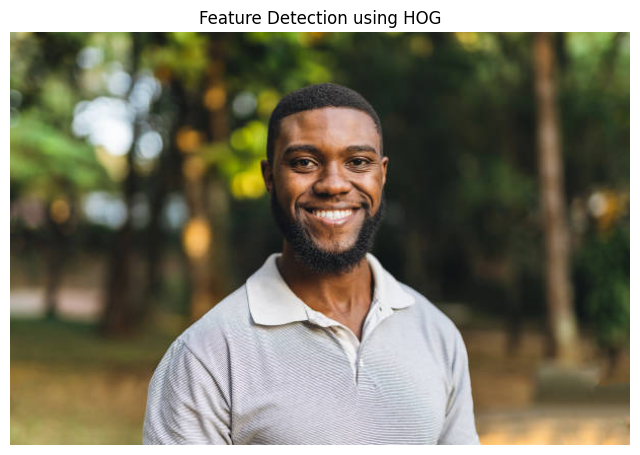

0
(9389520,)


In [22]:
method = "HOG"
keypoints, descriptors = extract_features(img, method)
visualize_features(img, keypoints, method)

print(len(keypoints))
print(descriptors.shape if descriptors is not None else None)

# 6. Video stream processing

In [10]:
from video_processing import optical_flow, background_subtraction

In [13]:
# video_path = "../data/video/people_walking.mp4"
video_path = "../data/video/video_3s.mp4"

In [14]:
optical_flow(video_path)

In [15]:
background_subtraction(video_path)

: 